In [1]:
import pandas as pd
import numpy as np
import re
# !pip install --upgrade plotly 
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
plt.style.use('seaborn-whitegrid')
import plotly.express as px
import plotly.graph_objects as go

In [2]:
pd.options.display.max_rows = 500
pd.options.display.max_columns = 500
pd.set_option('display.max_colwidth', -1)

In [3]:
gd = pd.read_csv('glassdoorfinal.csv')
rank = pd.read_csv('rank_final.csv')

In [4]:
gd

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,end_date,founded,industry,interview_difficulty,interview_n_reviews,location,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,start_date,ticker,website,year
0,488,4.7,91.0,Facebook,Company - Public (FB),4.4,10000+ employees,10/22/17,2004,Internet,3.1,"5,197","Menlo Park, CA",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,11/1/16,FB,www.facebook.com,NaN
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,10/22/17,1975,Health Care Services & Hospitals,2.6,292,"Moorestown, NJ",17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,11/1/16,NaN,www.bayada.com,NaN
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,10/22/17,1987,Accounting,2.9,"6,232","New York, NY",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,11/1/16,NaN,us-jobs.kpmg.com,NaN
3,693,3.9,80.0,Walt Disney Company,Company - Public (DIS),3.8,10000+ employees,10/22/17,1923,Motion Picture Production & Distribution,2.7,"1,311","Burbank, CA",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,11/1/16,DIS,www.disney.com,NaN
4,64,1.9,94.0,Liberty National,1900,4.1,1001 to 5000 employees,10/22/17,NaN,Subsidiary or Business Segment,1.8,278,"McKinney, TX",38,23,703,39,80,Insurance Carriers,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,11/1/16,NaN,www.libertynational.com,NaN
5,2918,4.3,77.0,Starbucks,Company - Public (SBUX),3.8,10000+ employees,10/22/17,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097","Seattle, WA",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,11/1/16,SBUX,www.starbucks.com,NaN
6,273,4.2,91.0,Shell,Company - Public (RDSA),3.9,10000+ employees,10/22/17,1907,Oil & Gas Exploration & Production,3.3,"1,512","Houston, TX",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,11/1/16,RDSA,www.shell.us,NaN
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,10/30/16,1916,Grocery Stores & Supermarkets,2.7,565,"Rochester, NY",14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,11/2/15,NaN,jobs.wegmans.com,NaN
8,377,3.6,78.0,SolarCity,2006,3.1,10000+ employees,10/31/15,NaN,Subsidiary or Business Segment,2.5,577,"San Mateo, CA",20,16,2341,64,51,Energy,No work life balance poor training Sometimes

In [5]:
gd['start_date'].unique()

array(['11/1/16', '11/2/15', '11/2/14', nan, '10/23/17'], dtype=object)

In [6]:
gd.loc[gd.start_date == '11/1/16','year'] = float(2018)
gd.loc[gd.start_date == '11/2/15','year'] = float(2017)
gd.loc[gd.start_date == '11/2/14','year'] = float(2016)
gd.loc[gd.start_date == '10/23/17','year'] = float(2019)

In [7]:
gd

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,end_date,founded,industry,interview_difficulty,interview_n_reviews,location,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,start_date,ticker,website,year
0,488,4.7,91.0,Facebook,Company - Public (FB),4.4,10000+ employees,10/22/17,2004,Internet,3.1,"5,197","Menlo Park, CA",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,11/1/16,FB,www.facebook.com,2018.0
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,10/22/17,1975,Health Care Services & Hospitals,2.6,292,"Moorestown, NJ",17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,11/1/16,NaN,www.bayada.com,2018.0
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,10/22/17,1987,Accounting,2.9,"6,232","New York, NY",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,11/1/16,NaN,us-jobs.kpmg.com,2018.0
3,693,3.9,80.0,Walt Disney Company,Company - Public (DIS),3.8,10000+ employees,10/22/17,1923,Motion Picture Production & Distribution,2.7,"1,311","Burbank, CA",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,11/1/16,DIS,www.disney.com,2018.0
4,64,1.9,94.0,Liberty National,1900,4.1,1001 to 5000 employees,10/22/17,NaN,Subsidiary or Business Segment,1.8,278,"McKinney, TX",38,23,703,39,80,Insurance Carriers,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,11/1/16,NaN,www.libertynational.com,2018.0
5,2918,4.3,77.0,Starbucks,Company - Public (SBUX),3.8,10000+ employees,10/22/17,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097","Seattle, WA",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,11/1/16,SBUX,www.starbucks.com,2018.0
6,273,4.2,91.0,Shell,Company - Public (RDSA),3.9,10000+ employees,10/22/17,1907,Oil & Gas Exploration & Production,3.3,"1,512","Houston, TX",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,11/1/16,RDSA,www.shell.us,2018.0
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,10/30/16,1916,Grocery Stores & Supermarkets,2.7,565,"Rochester, NY",14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,11/2/15,NaN,jobs.wegmans.com,2017.0
8,377,3.6,78.0,SolarCity,2006,3.1,10000+ employees,10/31/15,NaN,Subsidiary or Business Segment,2.5,577,"San Mateo, CA",20,16,2341,64,51,Energy,No work life balance

In [8]:
gd = gd.drop(['start_date','end_date'],1)
gd

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,location,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year
0,488,4.7,91.0,Facebook,Company - Public (FB),4.4,10000+ employees,2004,Internet,3.1,"5,197","Menlo Park, CA",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,FB,www.facebook.com,2018.0
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,1975,Health Care Services & Hospitals,2.6,292,"Moorestown, NJ",17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,NaN,www.bayada.com,2018.0
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,1987,Accounting,2.9,"6,232","New York, NY",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,NaN,us-jobs.kpmg.com,2018.0
3,693,3.9,80.0,Walt Disney Company,Company - Public (DIS),3.8,10000+ employees,1923,Motion Picture Production & Distribution,2.7,"1,311","Burbank, CA",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,DIS,www.disney.com,2018.0
4,64,1.9,94.0,Liberty National,1900,4.1,1001 to 5000 employees,NaN,Subsidiary or Business Segment,1.8,278,"McKinney, TX",38,23,703,39,80,Insurance Carriers,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,NaN,www.libertynational.com,2018.0
5,2918,4.3,77.0,Starbucks,Company - Public (SBUX),3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097","Seattle, WA",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2018.0
6,273,4.2,91.0,Shell,Company - Public (RDSA),3.9,10000+ employees,1907,Oil & Gas Exploration & Production,3.3,"1,512","Houston, TX",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,RDSA,www.shell.us,2018.0
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,1916,Grocery Stores & Supermarkets,2.7,565,"Rochester, NY",14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,NaN,jobs.wegmans.com,2017.0
8,377,3.6,78.0,SolarCity,2006,3.1,10000+ employees,NaN,Subsidiary or Business Segment,2.5,577,"San Mateo, CA",20,16,2341,64,51,Energy,No work life balance poor training Sometimes you work late or long hours to accommodate customer schedules,Good pay Great People Amazing Mission this is a really great company to work f

In [9]:
gd.cotype.sort_values()[0:49].index

Int64Index([543, 414,  32, 526, 386, 604, 439, 482, 162,   4, 397, 450, 539,
             54, 554, 405, 260, 143, 425, 507, 371, 457, 209, 308, 153, 160,
            566, 597, 515, 442, 603, 567,  73,  64, 598, 401, 387, 321, 485,
            419, 531, 108, 271, 610, 392, 333,   8, 378,  57],
           dtype='int64')

In [10]:
for i in gd.cotype.sort_values()[0:49].index:
    gd.founded[i] = gd.cotype[i]
    gd.cotype[i] = ''
    

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [11]:
gd[~gd.location.str.contains(',')].location

205    Frankfurt am Main (Germany)
445    Fuschl am See (Austria)    
540    Herzogenaurach (Germany)   
Name: location, dtype: object

In [12]:
gd.location[205] = 'Frankfurt am Main, Germany'
gd.location[445] = 'Fuschl am See, Austria' 
gd.location[540] = 'Herzogenaurach, Germany'

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [13]:
cs = gd.location.str.split(',',1,expand= True)
gd['city'] = cs[0]
gd['state'] = cs[1]

In [14]:
gd.cotype = gd.cotype.str.replace(r"\(.*\)","")

In [15]:
gd = gd.drop('location', axis =1)

In [16]:
gd

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state
0,488,4.7,91.0,Facebook,Company - Public,4.4,10000+ employees,2004,Internet,3.1,"5,197",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,FB,www.facebook.com,2018.0,Menlo Park,CA
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,1975,Health Care Services & Hospitals,2.6,292,17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,NaN,www.bayada.com,2018.0,Moorestown,NJ
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,1987,Accounting,2.9,"6,232",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,NaN,us-jobs.kpmg.com,2018.0,New York,NY
3,693,3.9,80.0,Walt Disney Company,Company - Public,3.8,10000+ employees,1923,Motion Picture Production & Distribution,2.7,"1,311",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,DIS,www.disney.com,2018.0,Burbank,CA
4,64,1.9,94.0,Liberty National,,4.1,1001 to 5000 employees,1900,Subsidiary or Business Segment,1.8,278,38,23,703,39,80,Insurance Carriers,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,NaN,www.libertynational.com,2018.0,McKinney,TX
5,2918,4.3,77.0,Starbucks,Company - Public,3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2018.0,Seattle,WA
6,273,4.2,91.0,Shell,Company - Public,3.9,10000+ employees,1907,Oil & Gas Exploration & Production,3.3,"1,512",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,RDSA,www.shell.us,2018.0,Houston,TX
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,1916,Grocery Stores & Supermarkets,2.7,565,14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,NaN,jobs.wegmans.com,2017.0,Rochester,NY
8,377,3.6,78.0,SolarCity,,3.1,10000+ employees,2006,Subsidiary or Business Segment,2.5,577,20,16,2341,64,51,Energy,No work life balance poor training Sometimes you work late or long hours to accommodate customer schedules,Good pay Great People Amazing Mission this is a really great company to work for if you love Elon this is the place for you Great place great peopl

In [17]:
miss = gd.loc[(gd.cotype =='')].index 

In [18]:
gd.loc[miss,'cotype']  = gd.loc[miss,'industry']

In [19]:
gd.loc[miss,'industry']= gd.loc[miss,'revenue']

In [20]:
gd.loc[miss,'revenue'] = np.nan

In [21]:
miss1 = gd.loc[gd.industry ==' $10+ billion (USD) per year' ].index

In [22]:
gd.loc[miss1,'revenue'] = gd.loc[miss1,'industry']
gd.loc[miss1, 'industry'] = np.nan

In [23]:
gd.loc[miss1]

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state
145,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6638,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2009.0,Cincinnati,OH
196,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6638,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2010.0,Cincinnati,OH
228,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6639,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2011.0,Cincinnati,OH
273,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6639,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2012.0,Cincinnati,OH
362,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6638,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2014.0,Cincinnati,OH
431,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6639,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2015.0,Cincinnati,OH
570,361,4.0,88.0,Procter & Gamble,Company - Public,4.0,10000+ employees,1837,NaN,3.3,"2,698",9,21,6638,70,84,$10+ billion (USD) per year,algumas pessoas com a mentalidade muito fora da P G Work life balance could be improved,People at P G are known for being top notch they re always happy to help regardless of their ranking in the company Work life balance is well promoted,PG,www.pg.com,2018.0,Cincinnati,OH


In [24]:
miss2 = gd.loc[gd.industry ==' $2 to $5 billion (USD) per year'].index

In [25]:
gd.loc[miss2,'revenue'] = gd.loc[miss2,'industry']
gd.loc[miss2, 'industry'] = np.nan

In [26]:
gd.loc[miss2]

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state
140,221,4.2,80.0,Juniper Networks,Company - Public,3.7,5001 to 10000 employees,1996,NaN,3.1,476,17,18,2176,65,72,$2 to $5 billion (USD) per year,Work life balance is little messed up Work gets repetitive and upper management sometimes meddles a lot in your work,Work life balance is maintained Good work environment and exposure,JNPR,www.juniper.net,2009.0,Sunnyvale,CA
195,221,4.2,80.0,Juniper Networks,Company - Public,3.7,5001 to 10000 employees,1996,NaN,3.1,476,17,18,2176,65,72,$2 to $5 billion (USD) per year,Work life balance is little messed up Work gets repetitive and upper management sometimes meddles a lot in your work,Work life balance is maintained Good work environment and exposure,JNPR,www.juniper.net,2010.0,Sunnyvale,CA


In [27]:
rank = rank.drop('Unnamed: 0',1)

In [28]:
rank

,year,rank,company,score
0,2019.0,#1,Bain & Company,4.6
1,2019.0,#2,Zoom Video Communications,4.5
2,2019.0,#3,In-N-Out Burger,4.5
3,2019.0,#4,Procore Technologies,4.5
4,2019.0,#5,Boston Consulting Group,4.5
5,2019.0,#6,LinkedIn,4.5
6,2019.0,#7,Facebook,4.5
7,2019.0,#8,Google,4.4
8,2019.0,#9,lululemon,4.4
9,2019.0,#10,Southwest Airlines,4.4


In [29]:
gd = gd.merge(rank, how = 'inner', on = ['year','company'])

In [30]:
gd

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state,rank,score
0,488,4.7,91.0,Facebook,Company - Public,4.4,10000+ employees,2004,Internet,3.1,"5,197",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,FB,www.facebook.com,2018.0,Menlo Park,CA,#1,4.6
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,1975,Health Care Services & Hospitals,2.6,292,17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,NaN,www.bayada.com,2018.0,Moorestown,NJ,#100,4.2
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,1987,Accounting,2.9,"6,232",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,NaN,us-jobs.kpmg.com,2018.0,New York,NY,#99,4.2
3,693,3.9,80.0,Walt Disney Company,Company - Public,3.8,10000+ employees,1923,Motion Picture Production & Distribution,2.7,"1,311",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,DIS,www.disney.com,2018.0,Burbank,CA,#98,4.2
4,64,1.9,94.0,Liberty National,Subsidiary or Business Segment,4.1,1001 to 5000 employees,1900,Insurance Carriers,1.8,278,38,23,703,39,80,NaN,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,NaN,www.libertynational.com,2018.0,McKinney,TX,#97,4.2
5,2918,4.3,77.0,Starbucks,Company - Public,3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2018.0,Seattle,WA,#96,4.2
6,273,4.2,91.0,Shell,Company - Public,3.9,10000+ employees,1907,Oil & Gas Exploration & Production,3.3,"1,512",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,RDSA,www.shell.us,2018.0,Houston,TX,#95,4.2
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,1916,Grocery Stores & Supermarkets,2.7,565,14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,NaN,jobs.wegmans.com,2017.0,Rochester,NY,#50,4.2
8,377,3.6,78.0,SolarCity,Subsidiary or Business Segment,3.1,10000+ employees,2006,Energy,2.5,577,20,16,2341,64,51,NaN,No work life balance poor training Sometimes you work late or long hours to accommodate customer schedules,Good pay Great People Amazing Mission this is a really great compa

In [44]:
gd_copy = gd

In [45]:
gd_copy

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state,rank,score
0,488,4.7,91.0,Facebook,Company - Public,4.4,10000+ employees,2004,Internet,3.1,"5,197",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,FB,www.facebook.com,2018.0,Menlo Park,CA,#1,4.6
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,1975,Health Care Services & Hospitals,2.6,292,17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,NaN,www.bayada.com,2018.0,Moorestown,NJ,#100,4.2
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,1987,Accounting,2.9,"6,232",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,NaN,us-jobs.kpmg.com,2018.0,New York,NY,#99,4.2
3,693,3.9,80.0,Walt Disney Company,Company - Public,3.8,10000+ employees,1923,Motion Picture Production & Distribution,2.7,"1,311",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,DIS,www.disney.com,2018.0,Burbank,CA,#98,4.2
4,64,1.9,94.0,Liberty National,Subsidiary or Business Segment,4.1,1001 to 5000 employees,1900,Insurance Carriers,1.8,278,38,23,703,39,80,NaN,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,NaN,www.libertynational.com,2018.0,McKinney,TX,#97,4.2
5,2918,4.3,77.0,Starbucks,Company - Public,3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2018.0,Seattle,WA,#96,4.2
6,273,4.2,91.0,Shell,Company - Public,3.9,10000+ employees,1907,Oil & Gas Exploration & Production,3.3,"1,512",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,RDSA,www.shell.us,2018.0,Houston,TX,#95,4.2
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,1916,Grocery Stores & Supermarkets,2.7,565,14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,NaN,jobs.wegmans.com,2017.0,Rochester,NY,#50,4.2
8,377,3.6,78.0,SolarCity,Subsidiary or Business Segment,3.1,10000+ employees,2006,Energy,2.5,577,20,16,2341,64,51,NaN,No work life balance poor training Sometimes you work late or long hours to accommodate customer schedules,Good pay Great People Amazing Mission this is a really great compa

In [33]:
#create csv for public companies to scrape financial website for stock returns
tsr = gd[['ticker','year']].dropna().sort_values('year')
tsr_one = tsr
tsr_three = tsr
tsr_five = tsr

In [35]:
tsr_one['begyear'] = tsr_one.year-1
tsr_one['endyear'] = tsr_one.year
tsr_one = tsr_one.drop(['year'],1)
tsr_one.begyear = [int(x) for x in tsr_one.begyear]
tsr_one.endyear = [int(x) for x in tsr_one.endyear]
tsr_one = tsr_one.set_index('ticker')
tsr_one_ytd = tsr_one.loc[tsr_one.endyear >= 2019]
tsr_one = tsr_one.loc[tsr_one.endyear < 2019]
# tsr_one_ytd.to_csv('tsr_one_ytd.csv')
# tsr_one.to_csv('tsr_one.csv')

In [40]:
tsr_three['begyear'] = tsr_three.year-1
tsr_three['endyear'] = tsr_three.year+2
tsr_three = tsr_three.drop(['year'],1)
tsr_three.begyear = [int(x) for x in tsr_three.begyear]
tsr_three.endyear = [int(x) for x in tsr_three.endyear]
tsr_three = tsr_three.set_index('ticker')
tsr_three = tsr_three.loc[tsr_three.endyear < 2019]
# tsr_three.to_csv('tsr_three.csv')

In [42]:
tsr_five['begyear'] = tsr_five.year-1
tsr_five['endyear'] = tsr_five.year+4
tsr_five = tsr_five.drop(['year'],1)
tsr_five.begyear = [int(x) for x in tsr_five.begyear]
tsr_five.endyear = [int(x) for x in tsr_five.endyear]
tsr_five = tsr_five.set_index('ticker')
tsr_five = tsr_five.loc[tsr_five.endyear < 2019]
# tsr_five.to_csv('tsr_five.csv')

In [46]:
tsr_one = pd.read_csv('tsr_one_out.csv')
tsr_one_ytd = pd.read_csv('tsr_one_ytd_out.csv')
tsr_three = pd.read_csv('tsr_three_out.csv')
tsr_five = pd.read_csv('tsr_five_out.csv')

In [47]:
tsr_one_ytd

,beg,begyear,end,endyear,ticker,one_ytd_return
0,Dec-12-2018,2018,Oct-11-2019,2019,PAYC,80.78%
1,Dec-12-2018,2018,Oct-11-2019,2019,BSX,3.68%
2,Dec-12-2018,2018,Oct-11-2019,2019,SAP,28.68%
3,Dec-12-2018,2018,Oct-11-2019,2019,CLX,-7.81%
4,Dec-12-2018,2018,Oct-11-2019,2019,EQR,37.08%
5,Dec-12-2018,2018,Oct-11-2019,2019,INTU,37.34%
6,Dec-12-2018,2018,Oct-11-2019,2019,NVDA,31.23%
7,Dec-12-2018,2018,Oct-11-2019,2019,MSFT,36.56%
8,Dec-12-2018,2018,Oct-11-2019,2019,ILMN,-12.15%
9,Dec-12-2018,2018,Oct-11-2019,2019,ADBE,16.27%


In [48]:
tsr_one.one_return = [float(x.strip('%'))  for x in tsr_one['one_return']]
tsr_one_ytd.one_ytd_return = [float(x.strip('%'))  for x in tsr_one_ytd['one_ytd_return']]
tsr_three.three_return = [float(x.strip('%'))  for x in tsr_three['three_return']]
tsr_five.five_return = [float(x.strip('%'))  for x in tsr_five['five_return']]

In [49]:
tsr_one['year'] = tsr_one.endyear 
tsr_one_ytd['year'] = tsr_one_ytd.endyear 
tsr_three['year'] = tsr_three.endyear - 2
tsr_five['year'] = tsr_five.endyear - 4

In [50]:
tsr_one = tsr_one[['one_return','ticker','year']]
tsr_one_ytd = tsr_one_ytd[['one_ytd_return','ticker','year']]
tsr_three = tsr_three[['three_return','ticker','year']]
tsr_five = tsr_five[['five_return','ticker','year']]


In [51]:
tsr = tsr_one.merge(tsr_one_ytd, how = 'outer', on = ['ticker','year']).\
merge(tsr_three, how = 'left', on = ['ticker','year'])\
.merge(tsr_five, how = 'left', on = ['ticker','year']).fillna(np.nan)

In [52]:
tsr

,one_return,ticker,year,one_ytd_return,three_return,five_return
0,30.57,NATI,2009,NaN,21.28,16.54
1,16.58,GIS,2009,NaN,12.88,13.62
2,53.56,JNPR,2009,NaN,4.33,3.40
3,65.94,MAR,2009,NaN,25.29,25.72
4,32.02,NKE,2009,NaN,27.30,27.26
5,2.27,CVX,2009,NaN,13.22,12.73
6,148.71,GS,2009,NaN,14.38,21.48
7,194.33,JWN,2009,NaN,60.16,39.77
8,66.45,CTXS,2009,NaN,44.02,20.03
9,51.87,SLB,2009,NaN,22.19,17.88


In [53]:
tsr.loc[282:320,'one_return'] = tsr.loc[282:320,'one_ytd_return']

In [54]:
tsr = tsr.drop('one_ytd_return',1)

In [55]:
tsr

,one_return,ticker,year,three_return,five_return
0,30.57,NATI,2009,21.28,16.54
1,16.58,GIS,2009,12.88,13.62
2,53.56,JNPR,2009,4.33,3.40
3,65.94,MAR,2009,25.29,25.72
4,32.02,NKE,2009,27.30,27.26
5,2.27,CVX,2009,13.22,12.73
6,148.71,GS,2009,14.38,21.48
7,194.33,JWN,2009,60.16,39.77
8,66.45,CTXS,2009,44.02,20.03
9,51.87,SLB,2009,22.19,17.88


In [56]:
gd_copy = gd_copy.merge(tsr, how = 'left', left_on = ['ticker','year'],right_on =['ticker','year'])

In [57]:
gd_copy

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state,rank,score,one_return,three_return,five_return
0,488,4.7,91.0,Facebook,Company - Public,4.4,10000+ employees,2004,Internet,3.1,"5,197",21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,FB,www.facebook.com,2018.0,Menlo Park,CA,#1,4.6,-18.34,NaN,NaN
1,191,2.9,90.0,BAYADA Home Health Care,Company - Private,4.1,10000+ employees,1975,Health Care Services & Hospitals,2.6,292,17,15,1677,68,81,$1 to $2 billion (USD) per year,Office staff is very friendly willing to work with under certain circumstances Industry wide low pay for some positions,Also so much recognition given not just to the field staff but office staff as well from upper management Flexible Schedule Paid Time Off Overtime,NaN,www.bayada.com,2018.0,Moorestown,NJ,#100,4.2,NaN,NaN,NaN
2,799,3.9,91.0,KPMG,Subsidiary or Business Segment,3.7,10000+ employees,1987,Accounting,2.9,"6,232",11,19,2915,70,73,$2 to $5 billion (USD) per year,Long working hours even as an intern Fairly high work pressure leading to a moderate work life balance,Work life balance is good for consulting Great work environment to be apart of,NaN,us-jobs.kpmg.com,2018.0,New York,NY,#99,4.2,NaN,NaN,NaN
3,693,3.9,80.0,Walt Disney Company,Company - Public,3.8,10000+ employees,1923,Motion Picture Production & Distribution,2.7,"1,311",11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,DIS,www.disney.com,2018.0,Burbank,CA,#98,4.2,6.13,NaN,NaN
4,64,1.9,94.0,Liberty National,Subsidiary or Business Segment,4.1,1001 to 5000 employees,1900,Insurance Carriers,1.8,278,38,23,703,39,80,NaN,It is a lot of hard work in the beginning but the reward far out weighs the sacrifice Because it is a 1099 position there are no benefits or paid time off,I am a mom of four and with the ability to have a flexible schedule I have been promoted to agency director in six months I m not sure what brought me here but the people my team and the overall atmosphere and good work of helping people is why i do what i do now,NaN,www.libertynational.com,2018.0,McKinney,TX,#97,4.2,NaN,NaN,NaN
5,2918,4.3,77.0,Starbucks,Company - Public,3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,"5,097",8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2018.0,Seattle,WA,#96,4.2,14.19,NaN,NaN
6,273,4.2,91.0,Shell,Company - Public,3.9,10000+ employees,1907,Oil & Gas Exploration & Production,3.3,"1,512",11,23,4470,66,78,$10+ billion (USD) per year,huge organization leading to slow decision making Work life balance differs by division,Takes care of employee s work life balance great place with a friendly working environment,RDSA,www.shell.us,2018.0,Houston,TX,#95,4.2,NaN,NaN,NaN
7,207,4.0,92.0,Wegmans Food Markets,Company - Private,4.0,10000+ employees,1916,Grocery Stores & Supermarkets,2.7,565,14,18,2202,68,82,$5 to $10 billion (USD) per year,I only left to secure a full time position in my current field Not a lot of upward mobility for part time employees,The allow for very flexible scheduling flexible hours and mostly nice people,NaN,jobs.wegmans.com,2017.0,Rochester,NY,#50,4.2,NaN,NaN,NaN
8,377,3.6,78.0,SolarCity,Subsidiary or Business Segment,3.1,10000+ employees,2006,Energy,2.5,577,20,16,2341,64,51,NaN,No work life balance poor training 

In [58]:
def try_int(x):
    try:
        return int(x)
    except ValueError:
        return x
    
def calc_age(x):
    try:
        return 2019-x
    except:
        return x

In [59]:
x = [try_int(x) for x in gd_copy.founded]

In [60]:
y = [calc_age(x) for x in x]
gd_copy['company_age'] = y

In [61]:
gd_copy.company_age = gd_copy.company_age.fillna(np.nan).replace(' Unknown', np.nan)\
.replace(' Nonprofit Organization', np.nan)

In [62]:
gd_copy['rank'] = [int(x.split('#')[1]) for x in gd_copy['rank']]

In [63]:
gd_copy.interview_n_reviews = [try_int(''.join(x.split(','))) for x in gd_copy.interview_n_reviews]


In [66]:
gd_copy.groupby('year').agg('median')

,benefits_n_reviews,benefits_rating,ceo_score,culture_score,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,rank,score,one_return,three_return,five_return,company_age
year,,,,,,,,,,,,,,,,,
2009.0,501.5,4.1,89.0,3.80,3.0,1533.0,12.0,18.0,4498.0,69.0,77.0,24.5,3.80,50.900,21.735,19.620,47.0
2010.0,365.5,4.1,86.0,3.80,3.0,1075.5,13.0,19.0,2967.0,68.5,75.5,24.5,3.70,13.220,7.320,13.140,54.5
2011.0,325.0,4.1,89.0,3.85,3.0,1003.5,13.0,18.0,2054.0,69.0,77.0,24.5,3.70,-2.870,12.620,8.560,55.0
2012.0,320.0,4.1,88.0,3.80,2.8,1044.5,12.0,18.0,2517.0,70.5,77.0,24.5,3.75,10.590,17.860,15.480,44.5
2013.0,225.0,4.2,89.0,3.90,2.9,754.0,13.0,17.0,1676.0,67.0,78.0,25.0,4.00,24.225,16.065,16.805,46.0
2014.0,319.0,4.1,90.0,3.90,3.0,881.0,13.0,18.0,2202.0,68.0,77.0,26.0,4.00,15.640,13.590,14.325,43.0
2015.0,218.0,4.1,91.0,4.00,2.9,706.0,13.0,18.0,1528.0,69.0,80.0,24.0,3.90,4.920,13.410,NaN,53.5
2016.0,189.5,4.3,92.0,4.00,2.9,656.0,16.5,16.0,1404.0,64.5,79.5,25.5,4.00,4.280,13.855,NaN,29.0
2017.0,214.0,4.3,92.0,4.10,2.9,706.0,13.0,17.0,1409.0,68.0,83.0,25.0,4.30,33.240,NaN,NaN,37.0


In [67]:
gd_copy.agg('median')

benefits_n_reviews      238.00 
benefits_rating         4.20   
ceo_score               91.00  
culture_score           4.00   
interview_difficulty    2.90   
interview_n_reviews     772.00 
negative_xp             13.00  
neutral_xp              17.00  
number_reviews          1777.00
positive_xp             69.00  
recommendation          80.00  
year                    2015.00
rank                    30.00  
score                   4.10   
one_return              15.64  
three_return            14.12  
five_return             14.82  
company_age             43.50  
dtype: float64

In [68]:
gd_stats = gd_copy.agg(['median']).T.iloc[[1,2,3,4,9,10],]

In [69]:
gd_stats = gd_stats.rename({'recommendation':'ceo_recommendation', 'positive_xp':'interview_positive_xp'}, axis = 'index').sort_index()

In [70]:
gd_stats =gd_stats.reset_index().rename({'index':'attributes'},axis = 'columns')

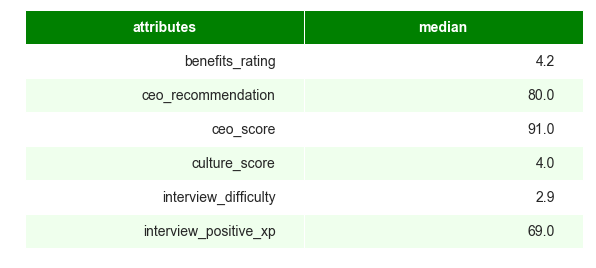

In [71]:
import matplotlib.pyplot as plt
import six


def render_mpl_table(data, col_width=3.0, row_height=0.625, font_size=14,
                     header_color='#008000', row_colors=['#EFFFED', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in  six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(gd_stats,header_columns=0, col_width=5.0)

In [72]:
gd_copy['ranking'] = np.where((gd_copy['rank']<11)&(gd_copy['rank']>0), '1-10',\
np.where((gd_copy['rank']<21)&(gd_copy['rank']>10), '11-20',\
np.where((gd_copy['rank']<31)&(gd_copy['rank']>20), '21-30',\
np.where((gd_copy['rank']<41)&(gd_copy['rank']>30), '31-40',\
         np.where((gd_copy['rank']<51)&(gd_copy['rank']>40), '41-50','50+')))))

In [73]:
ranking = gd_copy.groupby('ranking').agg('mean')[['one_return']]

In [74]:
ranking = ranking.reset_index()

In [75]:
ranking.one_return = round(ranking.one_return,1)

In [76]:
ranking

,ranking,one_return
0,1-10,23.3
1,11-20,20.8
2,21-30,21.3
3,31-40,17.0
4,41-50,16.9
5,50+,14.3


In [77]:
ranking_copy = ranking

In [78]:
ranking_copy['rank'] = [1,2,3,4,5,6]

In [79]:
ranking_copy['rank'].corr(ranking_copy['one_return'])

-0.9615504392819595

In [80]:
ranking_copy

,ranking,one_return,rank
0,1-10,23.3,1
1,11-20,20.8,2
2,21-30,21.3,3
3,31-40,17.0,4
4,41-50,16.9,5
5,50+,14.3,6


In [81]:
gd_copy['rank'].corr(gd_copy['one_return'])

-0.07739416832190452

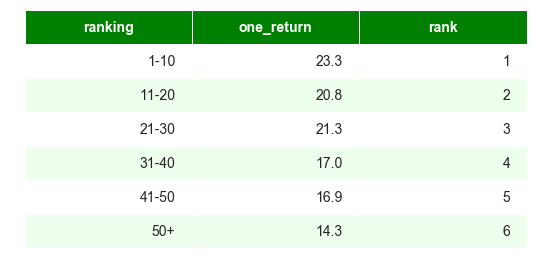

In [82]:
def render_mpl_table(data, col_width=3.0, row_height=0.625, font_size=14,
                     header_color='#008000', row_colors=['#EFFFED', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in  six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(ranking,header_columns=0, col_width=3.0)

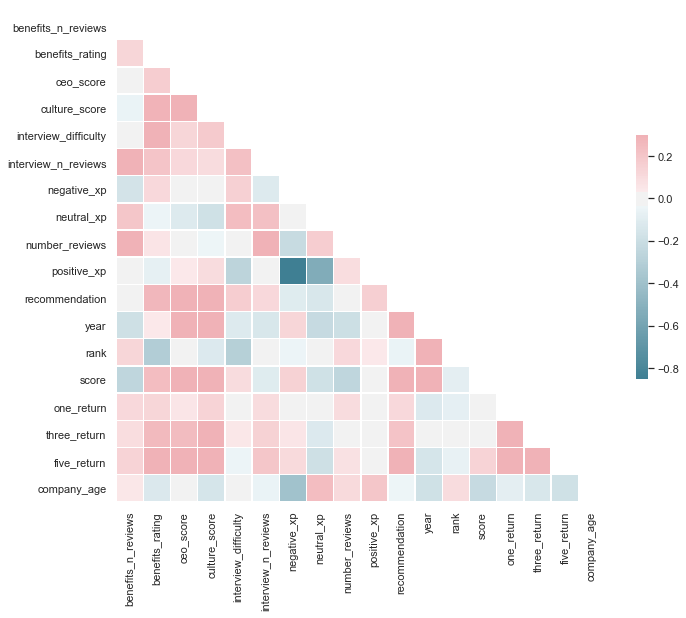

In [83]:
corr = gd_copy.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.set(style="white")
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [85]:
gd_public = gd_copy.drop(gd_copy.loc[np.isnan(gd_copy.one_return)\
            & np.isnan(gd_copy.three_return) & np.isnan(gd_copy.five_return)].index)

In [86]:
gd_public

,benefits_n_reviews,benefits_rating,ceo_score,company,cotype,culture_score,employee_count,founded,industry,interview_difficulty,interview_n_reviews,negative_xp,neutral_xp,number_reviews,positive_xp,recommendation,revenue,reviewscon,reviewspro,ticker,website,year,city,state,rank,score,one_return,three_return,five_return,company_age,ranking
0,488,4.7,91.0,Facebook,Company - Public,4.4,10000+ employees,2004,Internet,3.1,5197,21,22,1444,57,87,$10+ billion (USD) per year,Work life balance can be better sometimes long hours and disconnect to overall strategy,Free food great atmosphere like a university campus Working with really smart people,FB,www.facebook.com,2018.0,Menlo Park,CA,1,4.6,-18.34,NaN,NaN,15.0,1-10
3,693,3.9,80.0,Walt Disney Company,Company - Public,3.8,10000+ employees,1923,Motion Picture Production & Distribution,2.7,1311,11,18,4100,71,75,$10+ billion (USD) per year,Salary not so good and long hours without break Chance of signing on full time is only fifty fifty even if you are a good competent worker,Great company with great benefits Good work life balance benefits,DIS,www.disney.com,2018.0,Burbank,CA,98,4.2,6.13,NaN,NaN,96.0,50+
5,2918,4.3,77.0,Starbucks,Company - Public,3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,5097,8,16,23780,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2018.0,Seattle,WA,96,4.2,14.19,NaN,NaN,48.0,50+
10,719,4.6,96.0,Salesforce,Company - Public,4.3,10000+ employees,1999,Computer Hardware & Software,3.2,5489,9,5,5124,86,86,$10+ billion (USD) per year,Difficult to maintain work life balance There is no cons for working here,Salesforce is really a healthy organization The work life balance is amazing,CRM,www.salesforce.com,2014.0,San Francisco,CA,50,3.8,8.02,11.35,22.41,20.0,41-50
11,2918,4.3,77.0,Starbucks,Company - Public,3.8,10000+ employees,1971,Fast-Food & Quick-Service Restaurants,2.3,5097,8,16,23777,76,75,$10+ billion (USD) per year,Baristas not always inclined to come to work fast paced environment is not for everybody,great company with great benefits Good pay free coffee great benefits,SBUX,www.starbucks.com,2013.0,Seattle,WA,50,3.8,44.59,32.53,18.97,48.0,41-50
12,547,3.8,86.0,FedEx,Company - Public,3.7,10000+ employees,1973,Express Delivery Services,2.5,887,12,18,4437,70,73,$10+ billion (USD) per year,Sometimes you have to work long hours moving heavy boxes Living in Memphis is kind of scary,They emphasize the work life balance Great benefits and work environment,FDX,www.fedex.com,2012.0,Memphis,TN,50,3.5,10.59,29.85,20.09,46.0,41-50
13,1377,4.3,92.0,Capital One,Company - Public,3.8,10000+ employees,1994,Banks & Credit Unions,3.1,3928,15,20,6893,65,73,$10+ billion (USD) per year,Performance management associates in the same job level are ranked against each other by management Work life balance is easy to lose,Work in harmony good work life balance Great benefits amp paid time off,COF,www.capitalonecareers.com,2011.0,Mc Lean,VA,50,3.5,7.42,20.09,13.08,25.0,41-50
14,787,3.9,90.0,Marriott International,Company - Public,3.8,10000+ employees,1927,"Hotels, Motels, & Resorts",2.6,1466,11,16,6889,73,75,$10+ billion (USD) per year,Long hours pay is alright to good Sometimes a hard Work Life balance,Good company great benefits compensation Good benefits vacation time bonus,MAR,www.marriott.com,2010.0,Bethesda,MD,50,3.5,53.01,12.49,25.62,92.0,41-50
15,345,4.2,93.0,Paychex,Company - Public,4.0,10000+ employees,1971,Enterprise Software & Network Solutions,3.0,610,27,20,1337,53,79,$2 to $5 billion (USD) per year,work life balance but that doesn t mean the work is stress free Customer service at it s finest,Paychex offers great benefits including a very generous tuition assistance program that you can start using on the second month of employment Work life balance is encouraged,PAYX,www.paychex.com,2009.0,Roc

In [87]:
col = {'one_return':['count','min','max','mean','median','std'],
      'three_return':['count','min','max','mean','median','std'],
      'five_return':['count','min','max','mean','median','std']}
gd_public.groupby('year').agg(col)

one_return                                              three_return  \
            count    min     max       mean  median        std        count   
year                                                                          
2009.0  30        -2.48   194.33  60.792667  50.900  47.246781  30            
2010.0  27        -54.34  63.62   16.769630  13.220  27.727228  27            
2011.0  28        -50.65  32.55  -7.162143  -2.870   22.345067  28            
2012.0  27        -79.42  43.91   6.835556   10.590  24.986969  27            
2013.0  24        -10.32  89.17   32.950417  24.225  27.904033  24            
2014.0  31        -32.95  122.03  17.863226  15.640  27.036387  31            
2015.0  21        -36.75  68.49   6.122381   4.920   24.873662  21            
2016.0  24        -68.16  54.24   6.256250   4.280   25.363386  24            
2017.0  20        -11.25  113.84  34.435000  33.240  26.319924  0             
2018.0  45        -28.74  69.49   12.242444  8.430   24.626407  0             
2019.0  38        -30.60  81.99   22.514737  21.580  26.274624  0             

                                                    five_return                \
          min     max       mean  median        std       count    min    max   
year                                                                            
2009.0  1.11   60.16   23.981333  21.735  16.884929  30          3.40   67.27   
2010.0 -33.74  40.34   8.778148   7.320   15.035317  27         -4.45   40.28   
2011.0 -10.46  29.56   12.296071  12.620  8.841773   28         -13.39  28.34   
2012.0 -31.28  71.12   15.951481  17.860  18.103309  27         -29.85  45.97   
2013.0 -7.05   64.36   18.510417  16.065  19.579238  24         -1.17   45.81   
2014.0 -30.06  39.07   11.628065  13.590  11.859260  30         -8.11   30.69   
2015.0 -3.23   115.56  17.560000  13.410  24.673319  0          NaN    NaN      
2016.0 -19.42  53.22   16.531250  13.855  14.418695  0          NaN    NaN      
2017.0 NaN    NaN     NaN        NaN     NaN         0          NaN    NaN      
2018.0 NaN    NaN     NaN        NaN     NaN         0          NaN    NaN      
2019.0 NaN    NaN     NaN        NaN     NaN         0          NaN    NaN      

                                      
             mean  median        std  
year                                  
2009.0  23.065667  19.620  12.599842  
2010.0  15.251852  13.140  10.741649  
2011.0  8.412143   8.560   11.127647  
2012.0  13.481481  15.480  14.363721  
2013.0  17.797083  16.805  11.246839  
2014.0  13.709000  14.325  8.700066   
2015.0 NaN        NaN     NaN         
2016.0 NaN        NaN     NaN         
2017.0 NaN        NaN     NaN         
2018.0 NaN        NaN     NaN         
2019.0 NaN        NaN     NaN

In [88]:
gd_public.agg('mean')

benefits_n_reviews      563.507937 
benefits_rating         4.168889   
ceo_score               88.470968  
culture_score           3.983175   
interview_difficulty    2.917143   
interview_n_reviews     2033.873016
negative_xp             15.098413  
neutral_xp              17.819048  
number_reviews          4221.565079
positive_xp             67.082540  
recommendation          78.898413  
year                    2014.250794
rank                    32.942857  
score                   4.026349   
one_return              18.981079  
three_return            15.573868  
five_return             15.311506  
company_age             63.679365  
dtype: float64

In [89]:
avg_return = gd_public.groupby('year').agg({'one_return':['mean'],'three_return':['mean'],'five_return':['mean']})

In [90]:
avg_return = avg_return.reset_index()

In [91]:
avg_return = pd.melt(avg_return, id_vars = 'year', var_name = 'class', value_name = 'return')

In [92]:
avg_return

,year,class,return
0,2009.0,one_return,60.792667
1,2010.0,one_return,16.769630
2,2011.0,one_return,-7.162143
3,2012.0,one_return,6.835556
4,2013.0,one_return,32.950417
5,2014.0,one_return,17.863226
6,2015.0,one_return,6.122381
7,2016.0,one_return,6.256250
8,2017.0,one_return,34.435000
9,2018.0,one_return,12.242444


In [93]:
data = {'year':[2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019],\
        'sp_one_return': [26.53, 11.811, 0.144, 14.395, 27.103, 13.635, -0.009, 9.374, 18.593, -3.642, 16.89],\
        'sp_three_return':[12.314,8.602, 13.343, 18.22, 13.03, 7.513, 9.05, 7.718, np.nan, np.nan, np.nan],\
        'sp_five_return':[15.551, 13.093, 10.594, 12.561, 13.376, 7.267, np.nan, np.nan, np.nan, np.nan, np.nan]}
sp = pd.DataFrame(data)

In [94]:
sp

,year,sp_one_return,sp_three_return,sp_five_return
0,2009,26.530,12.314,15.551
1,2010,11.811,8.602,13.093
2,2011,0.144,13.343,10.594
3,2012,14.395,18.220,12.561
4,2013,27.103,13.030,13.376
5,2014,13.635,7.513,7.267
6,2015,-0.009,9.050,NaN
7,2016,9.374,7.718,NaN
8,2017,18.593,NaN,NaN
9,2018,-3.642,NaN,NaN


In [95]:
sp = pd.melt(sp, id_vars = 'year', var_name = 'class', value_name = 'return')

In [96]:
sp

,year,class,return
0,2009,sp_one_return,26.530
1,2010,sp_one_return,11.811
2,2011,sp_one_return,0.144
3,2012,sp_one_return,14.395
4,2013,sp_one_return,27.103
5,2014,sp_one_return,13.635
6,2015,sp_one_return,-0.009
7,2016,sp_one_return,9.374
8,2017,sp_one_return,18.593
9,2018,sp_one_return,-3.642


In [97]:
returns = avg_return.append(sp, ignore_index = True)

In [98]:
returns

,year,class,return
0,2009.0,one_return,60.792667
1,2010.0,one_return,16.769630
2,2011.0,one_return,-7.162143
3,2012.0,one_return,6.835556
4,2013.0,one_return,32.950417
5,2014.0,one_return,17.863226
6,2015.0,one_return,6.122381
7,2016.0,one_return,6.256250
8,2017.0,one_return,34.435000
9,2018.0,one_return,12.242444


In [99]:
returns.groupby('class').agg('mean')

,year,return
class,,
five_return,2014.0,15.286204
one_return,2014.0,19.056379
sp_five_return,2014.0,12.073667
sp_one_return,2014.0,12.256727
sp_three_return,2014.0,11.223750
three_return,2014.0,15.654596


In [100]:
one_returns = returns.loc[(returns['class'] == 'one_return') | (returns['class'] == 'sp_one_return')]

In [101]:
one_returns.groupby('class').agg('mean')

,year,return
class,,
one_return,2014.0,19.056379
sp_one_return,2014.0,12.256727


In [102]:
sp_compounded = returns.loc[(returns['class'] == 'sp_one_return')]

In [103]:
sp_compounded

,year,class,return
33,2009.0,sp_one_return,26.530
34,2010.0,sp_one_return,11.811
35,2011.0,sp_one_return,0.144
36,2012.0,sp_one_return,14.395
37,2013.0,sp_one_return,27.103
38,2014.0,sp_one_return,13.635
39,2015.0,sp_one_return,-0.009
40,2016.0,sp_one_return,9.374
41,2017.0,sp_one_return,18.593
42,2018.0,sp_one_return,-3.642


In [104]:
sp_compounded['1+return'] = ((sp_compounded['return'])/100)+1

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [105]:
sp_compounded['compounded'] = sp_compounded['1+return']

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [106]:
sp_compounded = sp_compounded.reset_index()

In [107]:
sp_compounded

,index,year,class,return,1+return,compounded
0,33,2009.0,sp_one_return,26.530,1.26530,1.26530
1,34,2010.0,sp_one_return,11.811,1.11811,1.11811
2,35,2011.0,sp_one_return,0.144,1.00144,1.00144
3,36,2012.0,sp_one_return,14.395,1.14395,1.14395
4,37,2013.0,sp_one_return,27.103,1.27103,1.27103
5,38,2014.0,sp_one_return,13.635,1.13635,1.13635
6,39,2015.0,sp_one_return,-0.009,0.99991,0.99991
7,40,2016.0,sp_one_return,9.374,1.09374,1.09374
8,41,2017.0,sp_one_return,18.593,1.18593,1.18593
9,42,2018.0,sp_one_return,-3.642,0.96358,0.96358


In [108]:
sp_eight = pd.DataFrame({'year':float(2008),'compounded':float(1)}, index = [0])

In [109]:
sp_compounded = sp_compounded.append(sp_eight)
sp_compounded  = sp_compounded.sort_values('year').reset_index().drop('index',1)

C:\Users\mjdch\Anaconda3\lib\site-packages\pandas\core\frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [110]:
sp_compounded = sp_compounded.drop('level_0',1)

In [111]:
sp_compounded

,1+return,class,compounded,return,year
0,NaN,NaN,1.00000,NaN,2008.0
1,1.26530,sp_one_return,1.26530,26.530,2009.0
2,1.11811,sp_one_return,1.11811,11.811,2010.0
3,1.00144,sp_one_return,1.00144,0.144,2011.0
4,1.14395,sp_one_return,1.14395,14.395,2012.0
5,1.27103,sp_one_return,1.27103,27.103,2013.0
6,1.13635,sp_one_return,1.13635,13.635,2014.0
7,0.99991,sp_one_return,0.99991,-0.009,2015.0
8,1.09374,sp_one_return,1.09374,9.374,2016.0
9,1.18593,sp_one_return,1.18593,18.593,2017.0


In [112]:
for i,e in list(enumerate(sp_compounded['compounded']))[1:12]:
    sp_compounded.iloc[i,2] = sp_compounded.iloc[i-1,2] *sp_compounded.iloc[i,0]

sp_compounded

,1+return,class,compounded,return,year
0,NaN,NaN,1.000000,NaN,2008.0
1,1.26530,sp_one_return,1.265300,26.530,2009.0
2,1.11811,sp_one_return,1.414745,11.811,2010.0
3,1.00144,sp_one_return,1.416782,0.144,2011.0
4,1.14395,sp_one_return,1.620728,14.395,2012.0
5,1.27103,sp_one_return,2.059993,27.103,2013.0
6,1.13635,sp_one_return,2.340873,13.635,2014.0
7,0.99991,sp_one_return,2.340663,-0.009,2015.0
8,1.09374,sp_one_return,2.560076,9.374,2016.0
9,1.18593,sp_one_return,3.036072,18.593,2017.0


In [113]:

sp_compounded

,1+return,class,compounded,return,year
0,NaN,NaN,1.000000,NaN,2008.0
1,1.26530,sp_one_return,1.265300,26.530,2009.0
2,1.11811,sp_one_return,1.414745,11.811,2010.0
3,1.00144,sp_one_return,1.416782,0.144,2011.0
4,1.14395,sp_one_return,1.620728,14.395,2012.0
5,1.27103,sp_one_return,2.059993,27.103,2013.0
6,1.13635,sp_one_return,2.340873,13.635,2014.0
7,0.99991,sp_one_return,2.340663,-0.009,2015.0
8,1.09374,sp_one_return,2.560076,9.374,2016.0
9,1.18593,sp_one_return,3.036072,18.593,2017.0


In [114]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=sp_compounded['year'], y = sp_compounded['compounded'], mode = 'lines+markers'))
fig.update_xaxes(title_text='Year', range = [2008,2019], nticks = 12)
fig.update_yaxes(title_text='($)', range = [1,7])
fig.update_layout(title=go.layout.Title(text="$1 invested in S&P 500 Companies",\
                                        x=0, xanchor = 'left',xref="paper"),template = "plotly_white")
fig.show()

In [115]:
gd_compounded =  returns.loc[(returns['class'] == 'one_return')]

In [116]:
gd_compounded['1+return'] = ((gd_compounded['return'])/100)+1

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [117]:
gd_compounded['compounded'] = gd_compounded['1+return']

C:\Users\mjdch\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [118]:
gd_compounded['compounded'][1:11]

1     1.167696
2     0.928379
3     1.068356
4     1.329504
5     1.178632
6     1.061224
7     1.062563
8     1.344350
9     1.122424
10    1.225147
Name: compounded, dtype: float64

In [119]:
eight = pd.DataFrame({'year':float(2008),'compounded':float(1)}, index = [0])

In [120]:
gd_compounded = gd_compounded.append(eight)
gd_compounded  = gd_compounded.sort_values('year').reset_index().drop('index',1)

C:\Users\mjdch\Anaconda3\lib\site-packages\pandas\core\frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [121]:
gd_compounded 

,1+return,class,compounded,return,year
0,NaN,NaN,1.000000,NaN,2008.0
1,1.607927,one_return,1.607927,60.792667,2009.0
2,1.167696,one_return,1.167696,16.769630,2010.0
3,0.928379,one_return,0.928379,-7.162143,2011.0
4,1.068356,one_return,1.068356,6.835556,2012.0
5,1.329504,one_return,1.329504,32.950417,2013.0
6,1.178632,one_return,1.178632,17.863226,2014.0
7,1.061224,one_return,1.061224,6.122381,2015.0
8,1.062563,one_return,1.062563,6.256250,2016.0
9,1.344350,one_return,1.344350,34.435000,2017.0


In [122]:
for i,e in list(enumerate(gd_compounded['compounded']))[1:12]:
    gd_compounded.iloc[i,2] = gd_compounded.iloc[i-1,2] *gd_compounded.iloc[i,0]

gd_compounded

,1+return,class,compounded,return,year
0,NaN,NaN,1.000000,NaN,2008.0
1,1.607927,one_return,1.607927,60.792667,2009.0
2,1.167696,one_return,1.877570,16.769630,2010.0
3,0.928379,one_return,1.743096,-7.162143,2011.0
4,1.068356,one_return,1.862246,6.835556,2012.0
5,1.329504,one_return,2.475864,32.950417,2013.0
6,1.178632,one_return,2.918133,17.863226,2014.0
7,1.061224,one_return,3.096792,6.122381,2015.0
8,1.062563,one_return,3.290535,6.256250,2016.0
9,1.344350,one_return,4.423631,34.435000,2017.0


In [123]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=gd_compounded['year'], y = gd_compounded['compounded'], mode = 'lines+markers'))
fig.update_xaxes(title_text='Year', range = [2008,2019], nticks = 12)
fig.update_yaxes(title_text='($)', range = [1,7])
fig.update_layout(title=go.layout.Title(text="$1 invested in Glassdoor's Best Places to Work Public Companies",\
                                        x=0, xanchor = 'left',xref="paper"),template = "plotly_white")
fig.show()

In [124]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=sp_compounded['year'], y = sp_compounded['compounded'],\
                         line = dict(color = 'red',width = 2), mode = 'lines+markers', name = 'S&P 500'))

fig.update_yaxes(title_text='$1 Invested', range = [1,7], title_font = dict(size = 17))
fig.update_layout(template = "plotly_white", autosize = False, width = 1000, height = 750,\
                  legend = go.layout.Legend(x=0.1,y =0.9, traceorder = 'normal', font = dict(size = 17)))

# fig.update_layout(title=go.layout.Title(text="$1 invested in Glassdoor 'Best Places to Work' vs. S&P 500 Companies",\
#                                         x=0, xanchor = 'left',xref="paper"),template = "plotly_white")


fig.add_trace(go.Scatter(x=gd_compounded['year'], y = gd_compounded['compounded'],\
                          line = dict(color = 'green', width = 2), mode = 'lines+markers',name = 'Glassdoor'))
fig.update_xaxes(title_text='Year', range = [2008,2019], nticks = 12, title_font = dict(size = 17))



fig.show()

In [125]:
three_returns = returns.loc[(returns['class'] == 'three_return') | (returns['class'] == 'sp_three_return')].dropna()

In [126]:
three_returns

,year,class,return
11,2009.0,three_return,23.981333
12,2010.0,three_return,8.778148
13,2011.0,three_return,12.296071
14,2012.0,three_return,15.951481
15,2013.0,three_return,18.510417
16,2014.0,three_return,11.628065
17,2015.0,three_return,17.560000
18,2016.0,three_return,16.531250
44,2009.0,sp_three_return,12.314000
45,2010.0,sp_three_return,8.602000


In [127]:
five_returns = returns.loc[(returns['class'] == 'five_return') | (returns['class'] == 'sp_five_return')].dropna()

In [128]:
five_returns

,year,class,return
22,2009.0,five_return,23.065667
23,2010.0,five_return,15.251852
24,2011.0,five_return,8.412143
25,2012.0,five_return,13.481481
26,2013.0,five_return,17.797083
27,2014.0,five_return,13.709000
55,2009.0,sp_five_return,15.551000
56,2010.0,sp_five_return,13.093000
57,2011.0,sp_five_return,10.594000
58,2012.0,sp_five_return,12.561000


In [129]:
one_returns

,year,class,return
0,2009.0,one_return,60.792667
1,2010.0,one_return,16.769630
2,2011.0,one_return,-7.162143
3,2012.0,one_return,6.835556
4,2013.0,one_return,32.950417
5,2014.0,one_return,17.863226
6,2015.0,one_return,6.122381
7,2016.0,one_return,6.256250
8,2017.0,one_return,34.435000
9,2018.0,one_return,12.242444


In [130]:
one_returns.groupby('class').agg({'return':'mean'})

,return
class,
one_return,19.056379
sp_one_return,12.256727


In [131]:
one_returns[0:10]['year']

0    2009.0
1    2010.0
2    2011.0
3    2012.0
4    2013.0
5    2014.0
6    2015.0
7    2016.0
8    2017.0
9    2018.0
Name: year, dtype: float64

In [132]:
one_returns[11:22]

,year,class,return
33,2009.0,sp_one_return,26.530
34,2010.0,sp_one_return,11.811
35,2011.0,sp_one_return,0.144
36,2012.0,sp_one_return,14.395
37,2013.0,sp_one_return,27.103
38,2014.0,sp_one_return,13.635
39,2015.0,sp_one_return,-0.009
40,2016.0,sp_one_return,9.374
41,2017.0,sp_one_return,18.593
42,2018.0,sp_one_return,-3.642


In [133]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=one_returns[0:11]['year'], y = one_returns[0:11]['return'], mode = 'lines+markers'))
fig.update_xaxes(title_text='Year', range = [2009,2019], nticks = 12)
# fig.update_yaxes(title_text='Value A')
fig.update_layout(template = "plotly_white")

fig.add_trace(go.Scatter(x=one_returns[0:11]['year'], y = one_returns[11:22]['return'], mode = 'lines+markers'))
fig.update_xaxes(title_text='Year', range = [2009,2019], nticks = 12)

fig.show()

In [134]:
three_returns

,year,class,return
11,2009.0,three_return,23.981333
12,2010.0,three_return,8.778148
13,2011.0,three_return,12.296071
14,2012.0,three_return,15.951481
15,2013.0,three_return,18.510417
16,2014.0,three_return,11.628065
17,2015.0,three_return,17.560000
18,2016.0,three_return,16.531250
44,2009.0,sp_three_return,12.314000
45,2010.0,sp_three_return,8.602000


In [135]:
three_returns.loc[three_returns['class'] == 'three_return','class'] = 'Glassdoor 3-yr Annualized Returns'

In [136]:
three_returns.loc[three_returns['class'] == 'sp_three_return','class'] = 'S&P 500 3-yr Annualized Returns'

In [137]:
three_returns['cohort'] = ['2009-2012','2010-2013','2011-2014','2012-2015','2013-2016','2014-2017', '2015-2018','2016-2019',\
                          '2009-2012','2010-2013','2011-2014','2012-2015','2013-2016','2014-2017', '2015-2018','2016-2019']

In [138]:
three_returns

,year,class,return,cohort
11,2009.0,Glassdoor 3-yr Annualized Returns,23.981333,2009-2012
12,2010.0,Glassdoor 3-yr Annualized Returns,8.778148,2010-2013
13,2011.0,Glassdoor 3-yr Annualized Returns,12.296071,2011-2014
14,2012.0,Glassdoor 3-yr Annualized Returns,15.951481,2012-2015
15,2013.0,Glassdoor 3-yr Annualized Returns,18.510417,2013-2016
16,2014.0,Glassdoor 3-yr Annualized Returns,11.628065,2014-2017
17,2015.0,Glassdoor 3-yr Annualized Returns,17.560000,2015-2018
18,2016.0,Glassdoor 3-yr Annualized Returns,16.531250,2016-2019
44,2009.0,S&P 500 3-yr Annualized Returns,12.314000,2009-2012
45,2010.0,S&P 500 3-yr Annualized Returns,8.602000,2010-2013


In [139]:

fig = px.bar(three_returns, x="cohort", y="return", color="class", barmode="group",\
             title='3-year Annualized Returns: Glassdoor "Best Places to Work" vs S&P 500',\
            labels={'year':'Cohort','return':'Annualized Return (%)','class': ''}\
            ,template = "plotly_white", color_discrete_sequence=['#008000','#DC143C'],\
            width=1000, height=600)


fig.show()

In [140]:
five_returns.loc[five_returns['class'] == 'five_return','class'] = 'Glassdoor 5-yr Annualized Returns'

In [141]:
five_returns['cohort'] = ['2009-2014','2010-2015','2011-2016','2012-2017','2013-2018','2014-2019',\
                          '2009-2014','2010-2015','2011-2016','2012-2017','2013-2018','2014-2019']

In [142]:
five_returns.loc[five_returns['class']== 'sp_five_return','class'] = 'S&P 500 5-yr Annualized Returns'

In [143]:
fig = px.bar(five_returns, x="cohort", y="return", color="class", barmode="group",\
             title='5-year Annualized Returns: Glassdoor "Best Places to Work" vs S&P 500',\
            labels={'year':'Cohort/Year','return':'Annualized Return (%)','class': ''}\
            ,template = "plotly_white", color_discrete_sequence=['#008000','#DC143C'],\
            width=1000, height=600)
fig.show()

In [144]:
gd_copy.groupby('company').agg({'company':['count']}).reset_index().sort_values(('company','count'), ascending = False)

company      
                                                     count
89   Google                                           11  
12   Apple                                            11  
20   Bain & Company                                   11  
195  Southwest Airlines                               10  
73   Facebook                                         9   
185  Salesforce                                       9   
38   Chevron                                          9   
192  Slalom                                           9   
26   Boston Consulting Group                          9   
131  McKinsey & Company                               8   
4    Adobe                                            8   
141  NIKE                                             7   
163  Procter & Gamble                                 7   
105  Intuit                                           7   
120  LinkedIn                                         7   
46   Costco Wholesale                                 7   
169  Qualcomm                                         7   
231  Wegmans Food Markets                             6   
34   CareerBuilder                                    6   
214  Trader Joe's                                     6   
143  National Instruments                             6   
147  NetApp                                           6   
101  In-N-Out Burger                                  6   
133  Memorial Sloan Kettering                         6   
83   Genentech                                        6   
92   H E B                                            6   
88   Goldman Sachs                                    5   
170  QuikTrip                                         5   
142  NVIDIA                                           5   
146  Nestlé Purina U.S.                               5   
182  SAP                                              5   
103  Intel Corporation                                5   
63   Edelman                                          5   
152  Northwestern Mutual                              5   
124  MITRE                                            5   
84   General Mills                                    5   
171  REI                                              5   
215  Travelers                                        4   
201  Stryker                                          4   
129  MathWorks                                        4   
76   FedEx                                            4   
199  Starbucks                                        4   
60   EY                                               4   
82   Gartner                                          4   
208  Texas Instruments                                4   
110  Johnson & Johnson                                4   
51   Delta Air Lines                                  4   
238  Zillow                                           4   
172  Rackspace                                        4   
3    Accenture                                        4   
42   Citrix                                           4   
161  Power Home Remodeling                            4   
235  World Wide Technology                            4   
86   Gensler                                          3   
159  Paylocity                                        3   
78   Fluor                                            3   
114  Keller Williams                                  3   
113  Kaiser Permanente                                3   
196  SpaceX                                           3   
176  Red Hat                                          3   
135  Microsoft                                        3   
167  Publix                                           3   
210  The Church of Jesus Christ of Latter-day Saints  3   
91   Guidewire                                        3   
168  PwC                                              3   
109  John Deere                                       3   
8    Akamai                      

In [145]:
ind_most_awards = gd_copy.groupby(['industry']).agg({'company':['count']}).reset_index().sort_values(('company','count'), ascending = False)

In [146]:
ind_most_awards = ind_most_awards[0:15]

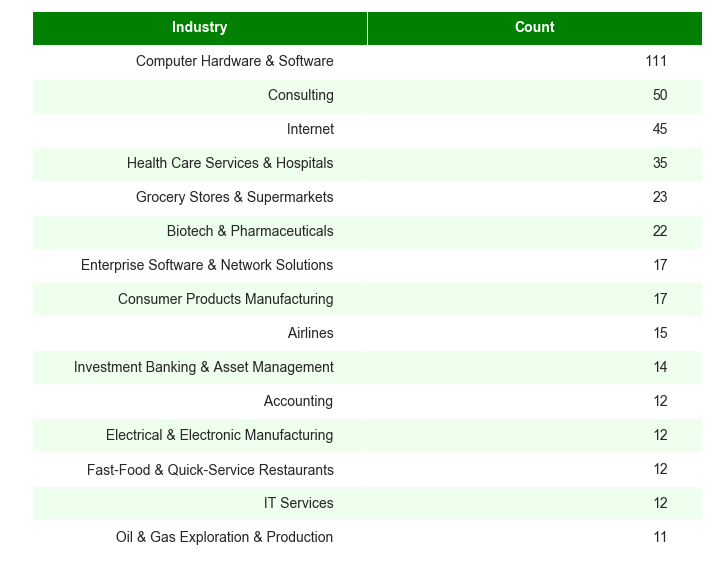

In [147]:

def render_mpl_table(data, col_width=5, row_height=0.625, font_size=14,
                     header_color='#008000', row_colors=['#EFFFED', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=['Industry', 'Count'], **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in  six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(ind_most_awards, header_columns=0, col_width= 6.0)

In [148]:
gd_copy.groupby(['industry','year']).agg({'company':['count']}).reset_index().sort_values(('company','count'), ascending = False)

,industry,year,company
,,,count
77,Computer Hardware & Software,2018.0,19
78,Computer Hardware & Software,2019.0,16
203,Health Care Services & Hospitals,2019.0,13
76,Computer Hardware & Software,2017.0,12
75,Computer Hardware & Software,2016.0,10
73,Computer Hardware & Software,2014.0,10
72,Computer Hardware & Software,2013.0,9
68,Computer Hardware & Software,2009.0,8
202,Health Care Services & Hospitals,2018.0,8


In [149]:
most_awards = gd_copy.groupby('company').agg({'company':['count']}).reset_index().sort_values(('company','count'), ascending = False)
most_awards


company      
                                                     count
89   Google                                           11  
12   Apple                                            11  
20   Bain & Company                                   11  
195  Southwest Airlines                               10  
73   Facebook                                         9   
185  Salesforce                                       9   
38   Chevron                                          9   
192  Slalom                                           9   
26   Boston Consulting Group                          9   
131  McKinsey & Company                               8   
4    Adobe                                            8   
141  NIKE                                             7   
163  Procter & Gamble                                 7   
105  Intuit                                           7   
120  LinkedIn                                         7   
46   Costco Wholesale                                 7   
169  Qualcomm                                         7   
231  Wegmans Food Markets                             6   
34   CareerBuilder                                    6   
214  Trader Joe's                                     6   
143  National Instruments                             6   
147  NetApp                                           6   
101  In-N-Out Burger                                  6   
133  Memorial Sloan Kettering                         6   
83   Genentech                                        6   
92   H E B                                            6   
88   Goldman Sachs                                    5   
170  QuikTrip                                         5   
142  NVIDIA                                           5   
146  Nestlé Purina U.S.                               5   
182  SAP                                              5   
103  Intel Corporation                                5   
63   Edelman                                          5   
152  Northwestern Mutual                              5   
124  MITRE                                            5   
84   General Mills                                    5   
171  REI                                              5   
215  Travelers                                        4   
201  Stryker                                          4   
129  MathWorks                                        4   
76   FedEx                                            4   
199  Starbucks                                        4   
60   EY                                               4   
82   Gartner                                          4   
208  Texas Instruments                                4   
110  Johnson & Johnson                                4   
51   Delta Air Lines                                  4   
238  Zillow                                           4   
172  Rackspace                                        4   
3    Accenture                                        4   
42   Citrix                                           4   
161  Power Home Remodeling                            4   
235  World Wide Technology                            4   
86   Gensler                                          3   
159  Paylocity                                        3   
78   Fluor                                            3   
114  Keller Williams                                  3   
113  Kaiser Permanente                                3   
196  SpaceX                                           3   
176  Red Hat                                          3   
135  Microsoft                                        3   
167  Publix                                           3   
210  The Church of Jesus Christ of Latter-day Saints  3   
91   Guidewire                                        3   
168  PwC                                              3   
109  John Deere                                       3   
8    Akamai                      

In [150]:
most_awards = most_awards.loc[most_awards[('company','count')]>6]

In [151]:
most_awards

company      
                             count
89   Google                   11  
12   Apple                    11  
20   Bain & Company           11  
195  Southwest Airlines       10  
73   Facebook                 9   
185  Salesforce               9   
38   Chevron                  9   
192  Slalom                   9   
26   Boston Consulting Group  9   
131  McKinsey & Company       8   
4    Adobe                    8   
141  NIKE                     7   
163  Procter & Gamble         7   
105  Intuit                   7   
120  LinkedIn                 7   
46   Costco Wholesale         7   
169  Qualcomm                 7

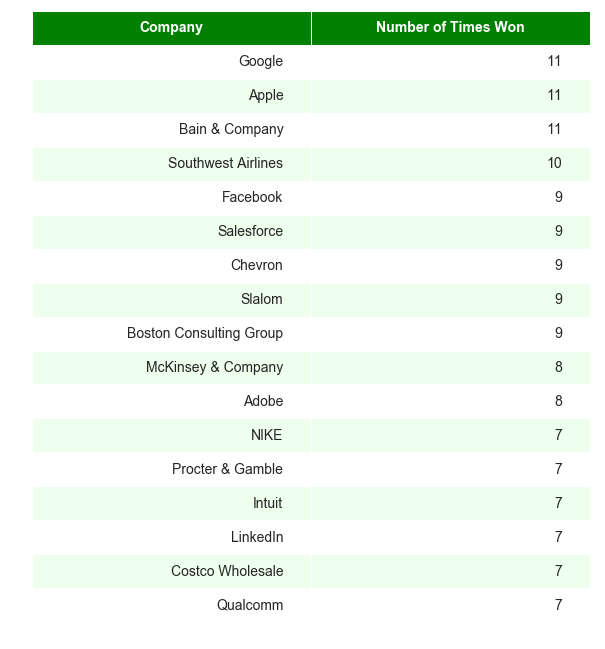

In [152]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import six



def render_mpl_table(data, col_width=5, row_height=0.625, font_size=14,
                     header_color='#008000', row_colors=['#EFFFED', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=['Company', 'Number of Times Won'], **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in  six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(most_awards, header_columns=0, col_width= 5.0)

In [153]:
    
from wordcloud import WordCloud
wc = WordCloud(background_color="white", max_words=2000, width=800, height=400)
# generate word cloud
wc.generate(' '.join(gd['reviewspro']))

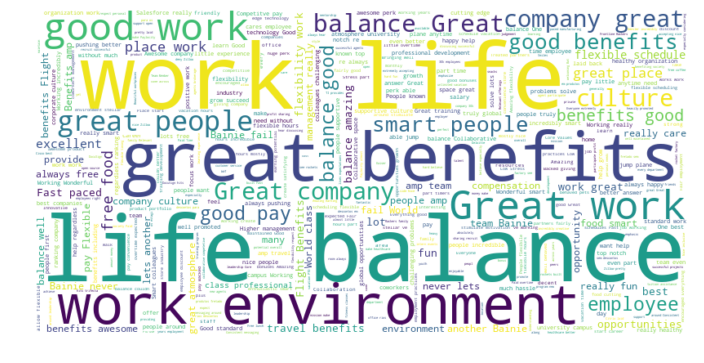

In [154]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [155]:
wc.generate(' '.join(gd['reviewspro'])).to_file('pro_reviews.png')

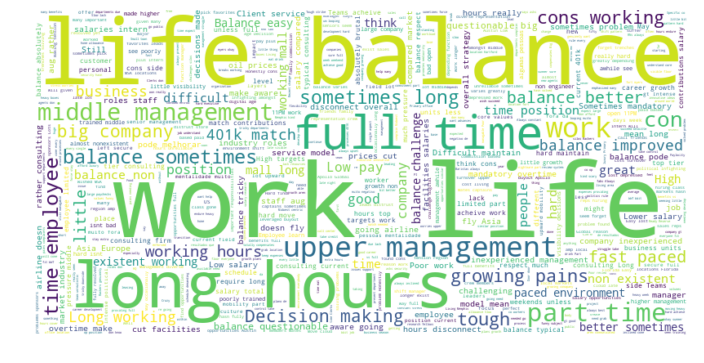

In [156]:


wc = WordCloud(background_color="white", max_words=2000, width=800, height=400)
# generate word cloud
wc.generate(' '.join(gd['reviewscon']))
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [157]:
wc.generate(' '.join(gd['reviewscon'])).to_file('con_reviews.png')